In [9]:
from datetime import datetime
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
import numpy as np
from sklearn.model_selection import TimeSeriesSplit, train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from tqdm.notebook import tqdm

pio.templates.default = 'plotly_dark'

## Data Source

Hourly historical data from: https://www.cryptodatadownload.com/data/bitfinex/

In [18]:
df = pd.read_csv('../data/raw/eth_hourly_ends_06282021.csv', skiprows=1)
df.drop(['Volume USD', 'unix', 'symbol'], axis=1, inplace=True)
df = df.rename({'date': 'TimeStamp', 'Volume ETH': 'Volume_ETH', 'close': 'CurrentClose'}, axis=1)
df['TimeStamp'] = pd.to_datetime(df['TimeStamp'])
df.sort_values(by='TimeStamp', ascending=True, inplace=True)
target = df['CurrentClose'].shift(-1)
df['NextClose'] = target
df.dropna(inplace=True, axis=0)

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27378 entries, 27378 to 1
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   TimeStamp     27378 non-null  datetime64[ns]
 1   open          27378 non-null  float64       
 2   high          27378 non-null  float64       
 3   low           27378 non-null  float64       
 4   CurrentClose  27378 non-null  float64       
 5   Volume_ETH    27378 non-null  float64       
 6   NextClose     27378 non-null  float64       
dtypes: datetime64[ns](1), float64(6)
memory usage: 1.7 MB


In [20]:
df['percentage_change'] = df['NextClose'] / df['CurrentClose']
df['percentage_change'] -= 1

In [21]:
df['increased_flag'] = df['percentage_change'].apply(lambda x: 1 if x >= 1 else 0)

<AxesSubplot:xlabel='TimeStamp', ylabel='percentage_change'>

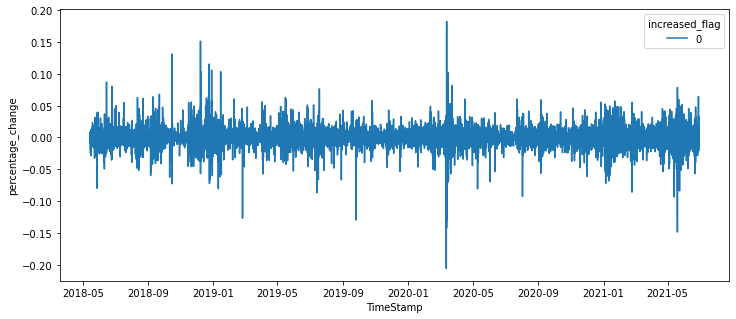

In [22]:
plt.figure(figsize=(12, 5))
sns.lineplot(
    x='TimeStamp', 
    y='percentage_change', 
    data=df, 
    hue='increased_flag'
)

In [23]:
corr = df.corr()

idx = corr.index
cols = corr.columns

<AxesSubplot:>

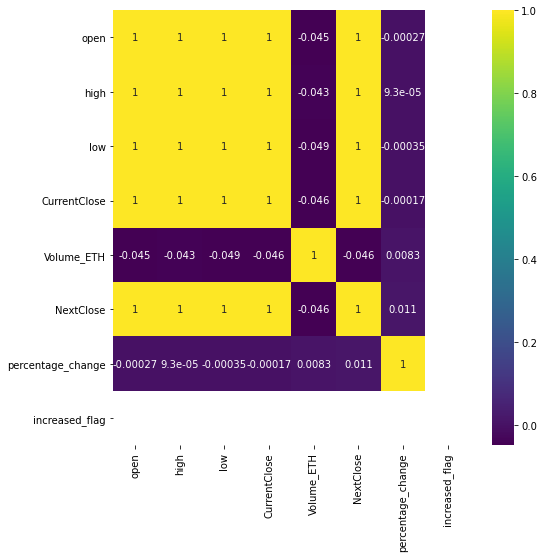

In [24]:
plt.figure(figsize=(8,8))
sns.heatmap(corr.values, cmap='viridis', xticklabels=cols, yticklabels=idx, annot=True)

In [25]:
df['moving_average'] = df['percentage_change'].rolling(12).mean()

In [26]:
fig = px.line(
    df, 
    x="TimeStamp", 
    y=["percentage_change","moving_average"], 
    template = 'plotly_dark'
)
fig.show()

In [27]:
target = 'NextClose'
columns_to_drop = ['percentage_change', 'increased_flag', 'moving_average']
df.drop(columns_to_drop, axis=1, inplace=True)
df.set_index('TimeStamp', inplace=True)

In [28]:
X = df.drop(target, axis=1)
y = df[target]

In [29]:
def get_metrics(y_pred, y_true):
    MAE = mean_absolute_error(y_true=y_true, y_pred=y_pred)
    MSE = mean_squared_error(y_true=y_true, y_pred=y_pred)
    RMSE = np.sqrt(MAE)
    R2 = r2_score(y_true=y_true, y_pred=y_pred)
    return {
        'mae': MAE,
        'mse': MSE,
        'rmse': RMSE,
        'r2': R2
    }

## Time Series Splitting

In [30]:
tscv = TimeSeriesSplit(n_splits=100)

In [31]:
train_metrics = []
test_metrics = []

for train_index, test_index in tqdm(tscv.split(X), total=tscv.n_splits):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    model = GradientBoostingRegressor()
    model.fit(X_train, y_train)
    
    train_preds = model.predict(X_train)
    test_preds = model.predict(X_test)
    
    train_m = get_metrics(y_pred=train_preds, y_true=y_train)
    test_m = get_metrics(y_pred=test_preds, y_true=y_test)
    
    train_metrics.append(train_m)
    test_metrics.append(test_m)

  0%|          | 0/100 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
train_metrics = pd.DataFrame(train_metrics)
test_metrics = pd.DataFrame(test_metrics)

train_metrics['split'] = 'train'
test_metrics['split'] = 'test'

In [ ]:
train_metrics.mean()

In [ ]:
test_metrics.mean()

## Standard Train/Test/Split

In [32]:
X_train, X_final, y_train, y_final = train_test_split(X, y, test_size=0.3, random_state=101)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2)

In [33]:
model = GradientBoostingRegressor()

In [34]:
model.fit(X_train, y_train)

GradientBoostingRegressor()

In [35]:
train_preds = model.predict(X_train)
val_preds = model.predict(X_val)
test_preds = model.predict(X_test)

train_m = get_metrics(y_pred=train_preds, y_true=y_train)
val_m = get_metrics(y_pred=val_preds, y_true=y_val)
test_m = get_metrics(y_pred=test_preds, y_true=y_test)

In [36]:
train_metrics = pd.DataFrame([train_m])
val_metrics = pd.DataFrame([val_m])
test_metrics = pd.DataFrame([test_m])

train_metrics['split'] = 'train'
val_metrics['split'] = 'val'
test_metrics['split'] = 'test'
metrics = pd.concat((train_metrics, val_metrics, test_metrics), axis=0)
metrics

,mae,mse,rmse,r2,split
0,4.921427,115.169314,2.218429,0.999783,train
0,5.813959,208.543114,2.411215,0.999589,val
0,1.470286,3.743864,1.212554,0.964585,test


In [37]:
diff = (y_test-test_preds).values

In [38]:
outputs = pd.concat(
    (pd.Series(test_preds), pd.Series(y_test.values), pd.Series(diff)), 
    axis=1
)
outputs.columns = ['model_prediction', 'true_nextclose', 'true_minus_predicted']
outputs.head()

,model_prediction,true_nextclose,true_minus_predicted
0,144.655066,146.47,1.814934
1,144.876295,146.33,1.453705
2,144.876295,145.08,0.203705
3,144.655066,143.41,-1.245066
4,144.655066,141.93,-2.725066


In [39]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=outputs.index, 
        y=outputs.model_prediction,
        mode='lines',
        name='model'
    )
)

fig.add_trace(
    go.Scatter(
        x=outputs.index, 
        y=outputs.true_nextclose,
        mode='lines',
        name='true_value'
    )
)

fig.show()

In [40]:
px.line(outputs, y='true_minus_predicted')

In [41]:
df.to_csv('../data/processed/eth_hourly.csv')